In [15]:
# Import statements
import numpy as np
import argparse
import cv2
import os
import wget

In [83]:
# Paths to load the model
DIR = "/Users/omer Khan/Desktop/Semester 6/CV/Computer Vision Project"
PROTOTXT = "./colorization_deploy_v2.prototxt"
POINTS = "./pts_in_hull.npy"
MODEL = "./colorization_release_v2.caffemodel"
PROTOTXT = os.path.normpath(PROTOTXT)
MODEL = os.path.normpath(MODEL)
net = cv2.dnn.readNetFromCaffe(PROTOTXT, MODEL)
pts = np.load(POINTS, allow_pickle=True)

In [94]:
# Load centers for ab channel quantization used for rebalancing.
class8 = net.getLayerId("class8_ab")
conv8 = net.getLayerId("conv8_313_rh")
pts = pts.transpose().reshape(2, 313, 1, 1)
net.getLayer(class8).blobs = [pts.astype("float32")]
net.getLayer(conv8).blobs = [np.full([1, 313], 2.606, dtype="float32")]

In [95]:
# Create the output directory if it doesn't exist
output_dir = "./grey2color"
os.makedirs(output_dir, exist_ok=True)

In [96]:
# Manually create the args namespace object and set the values
args = argparse.Namespace(image='gray')
# Get the list of grayscale image files in the input folder
input_files = os.listdir(args.image)
input_files.sort()  # Sort the files to ensure consistent ordering
# Manually create the args namespace object and set the values
args = argparse.Namespace(image='input_images', color_folder='color')

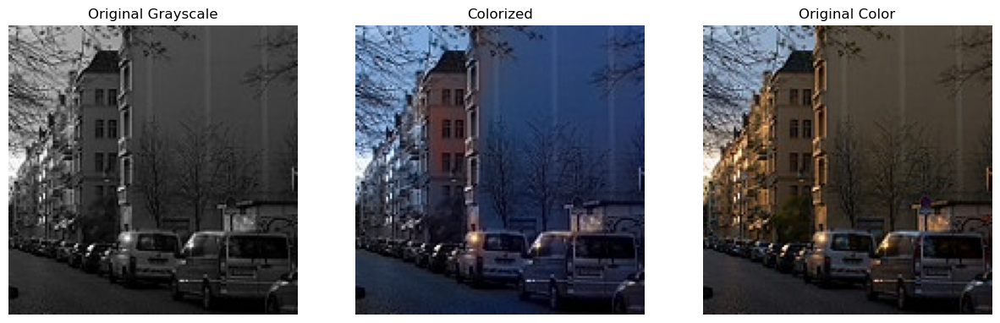

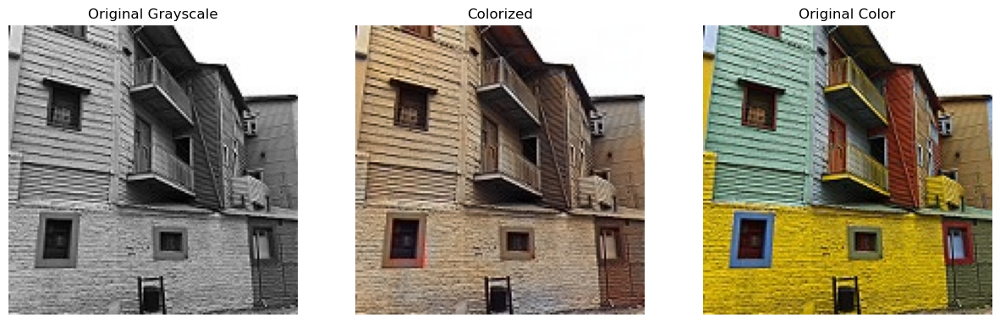

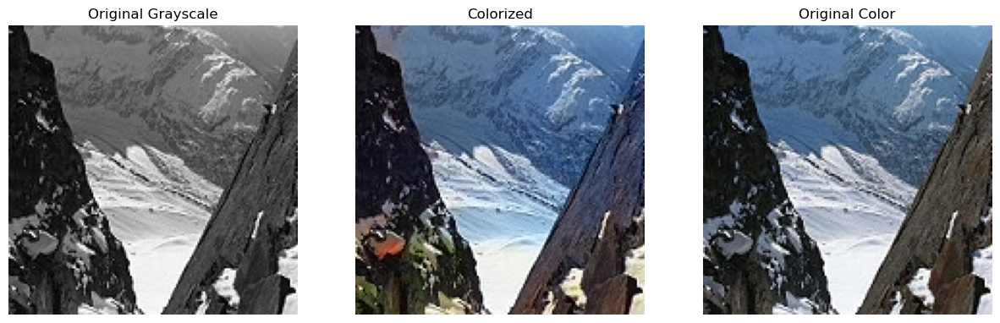

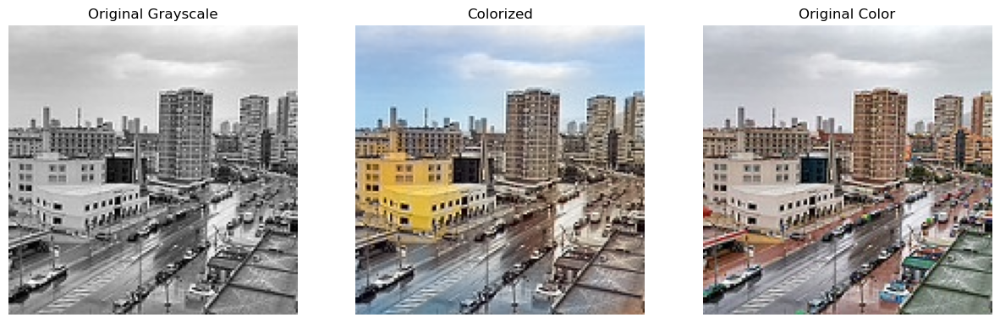

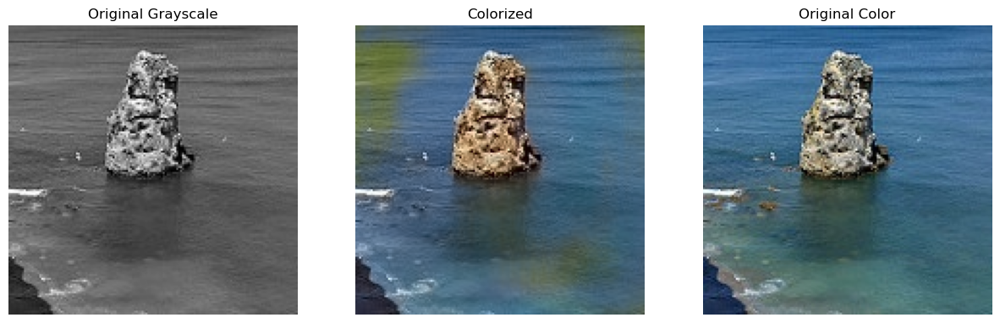

...

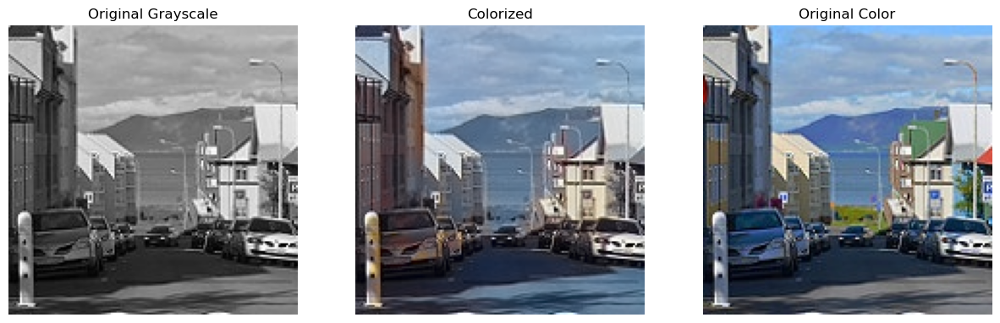

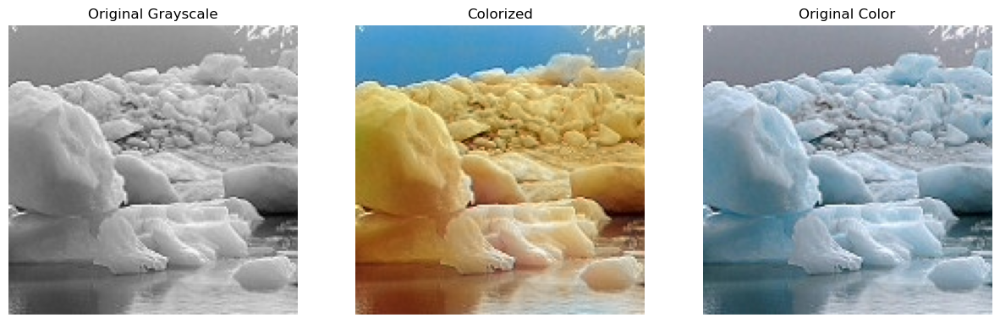

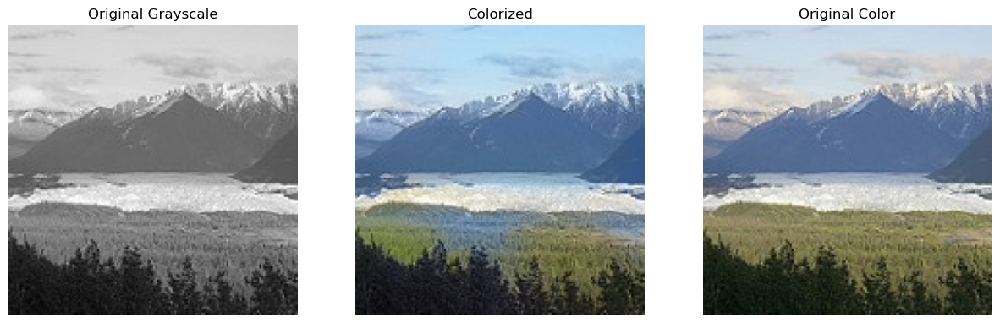

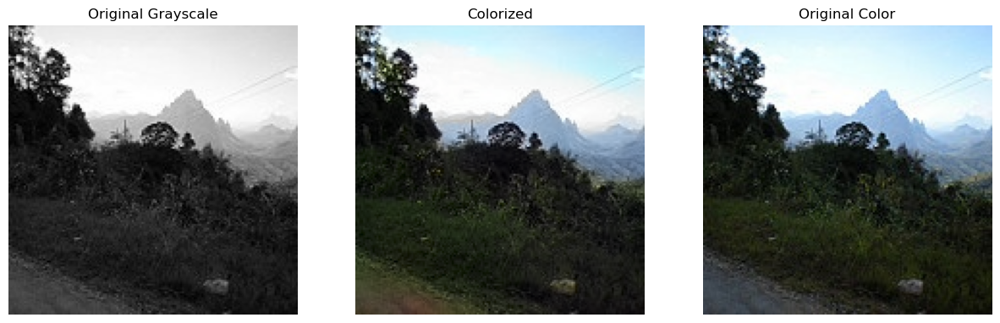

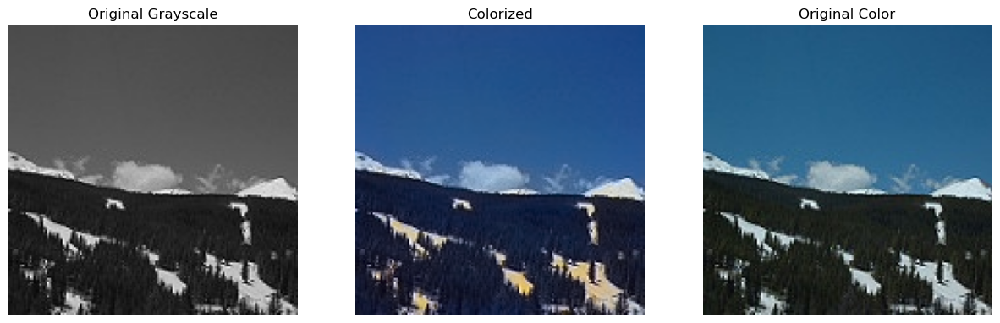

In [101]:
# Iterate over the grayscale images and colorize each one
for filename in input_files:
    # Load the grayscale image
    grayscale_path = os.path.join("gray", filename)
    image = cv2.imread(grayscale_path)

    if image is None:
        print(f"Error reading image: {grayscale_path}")
        continue

    # Colorize the image
    scaled = image.astype("float32") / 255.0
    lab = cv2.cvtColor(scaled, cv2.COLOR_BGR2LAB)

    resized = cv2.resize(lab, (224, 224))
    L = cv2.split(resized)[0]
    L -= 50

    net.setInput(cv2.dnn.blobFromImage(L))
    ab = net.forward()[0, :, :, :].transpose((1, 2, 0))

    ab = cv2.resize(ab, (image.shape[1], image.shape[0]))

    L = cv2.split(lab)[0]
    colorized = np.concatenate((L[:, :, np.newaxis], ab), axis=2)

    colorized = cv2.cvtColor(colorized, cv2.COLOR_LAB2BGR)
    colorized = np.clip(colorized, 0, 1)

    colorized = (255 * colorized).astype("uint8")

    # Save the colorized image
    output_path = os.path.join(output_dir, filename)
    cv2.imwrite(output_path, colorized)

    # Display the original grayscale image, colorized image, and original color image side by side
    color_path = os.path.join(args.color_folder, filename)
    color_image = cv2.imread(color_path)

    fig, ax = plt.subplots(1, 3, figsize=(15, 5))

    # Original grayscale image
    ax[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    ax[0].set_title("Original Grayscale")
    ax[0].axis("off")

    # Colorized image
    ax[1].imshow(cv2.cvtColor(colorized, cv2.COLOR_BGR2RGB))
    ax[1].set_title("Colorized")
    ax[1].axis("off")

    # Original color image
    ax[2].imshow(cv2.cvtColor(color_image, cv2.COLOR_BGR2RGB))
    ax[2].set_title("Original Color")
    ax[2].axis("off")

    plt.show()

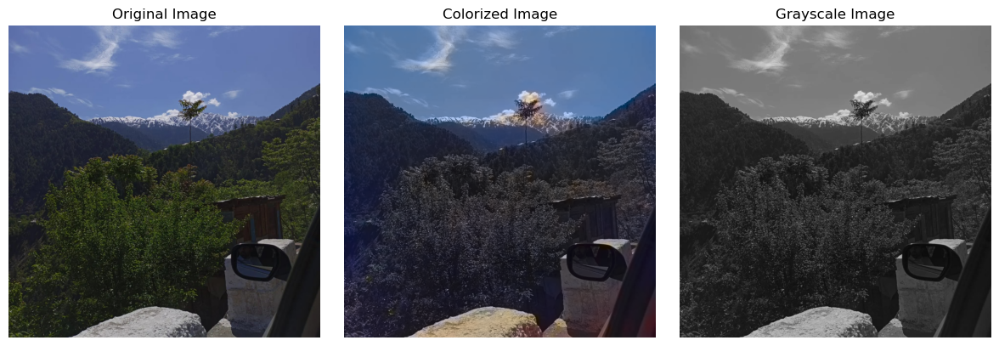

In [125]:
import cv2
import matplotlib.pyplot as plt

def colorize_image(image_path):
    # Load the image
    image = cv2.imread(image_path)

    if image is None:
        print(f"Error reading image: {image_path}")
        return None

    # Colorize the image (your colorization code goes here)
    scaled = image.astype("float32") / 255.0
    lab = cv2.cvtColor(scaled, cv2.COLOR_BGR2LAB)

    resized = cv2.resize(lab, (224, 224))
    L = cv2.split(resized)[0]
    L -= 50

    net.setInput(cv2.dnn.blobFromImage(L))
    ab = net.forward()[0, :, :, :].transpose((1, 2, 0))

    ab = cv2.resize(ab, (image.shape[1], image.shape[0]))

    L = cv2.split(lab)[0]
    colorized = np.concatenate((L[:, :, np.newaxis], ab), axis=2)

    colorized = cv2.cvtColor(colorized, cv2.COLOR_LAB2BGR)
    colorized = np.clip(colorized, 0, 1)

    colorized = (255 * colorized).astype("uint8")

    # Convert the image to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Display the images
    fig, ax = plt.subplots(1, 3, figsize=(12, 4))

    # Original image
    ax[0].imshow(original)
    ax[0].set_title("Original Image")
    ax[0].axis("off")

    # Colorized image
    ax[1].imshow(cv2.cvtColor(colorized, cv2.COLOR_BGR2RGB))
    ax[1].set_title("Colorized Image")
    ax[1].axis("off")

    # Grayscale image
    ax[2].imshow(gray_image, cmap="gray")
    ax[2].set_title("Grayscale Image")
    ax[2].axis("off")

    plt.tight_layout()
    plt.show()

# Example usage
image_path = "gray_scenery.jpg"
colorized_image = colorize_image(image_path)

In [124]:
import cv2

def convert_to_grayscale(image_path, output_path):
    # Load the image
    image = cv2.imread(image_path)

    if image is None:
        print(f"Error reading image: {image_path}")
        return

    # Convert the image to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Save the grayscale image
    cv2.imwrite(output_path, gray_image)
    print(f"Grayscale image saved: {output_path}")

# Example usage
image_path = "scenery.jpeg"
output_path = "gray_scenery.jpg"
convert_to_grayscale(image_path, output_path)

Grayscale image saved: gray_scenery.jpg


In [123]:
original = plt.imread("scenery.jpeg")